<table>
<tr>                                                                                   
     <th>
         <div style='padding:15px;color:#030aa7;font-size:240%;text-align: center;font-style: italic;font-weight: bold;font-family: Georgia, serif'><a href="https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data">Breast Cancer Wisconsin (Diagnostic)</a></div>
     </th>
     <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/breast_cancer_logo.png" width="96"></th>
 </tr>
</table>

<div style='text-align: center'>
<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/breast_cancer.png" width="512">
</div>

<div style='padding:15px;color:#030aa7;font-size:100%;text-align: left;font-family: Georgia, serif'>Les variables sont calculées à partir d'une image numérisée d'une ponction d'aspiration à l'aiguille fine (FNA) utilisée pour obtenir des échantillons à partir de ganglions lymphatique. Elles décrivent les caractéristiques des noyaux cellulaires présents sur l'image.</div>

<div style='padding:15px;color:#030aa7;font-size:100%;text-align: left;font-family: Georgia, serif'><a href="https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic">Veuillez vous référer à la page <span style="font-weight: bold; color: blue">UC Irvine Machine Learning Repository</span>
 officielle pour plus de détails.</a></div>

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Introduction</div></b>
## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Import libriries </div></b>

In [1]:
import pandas as pd, numpy as np, seaborn as sns, warnings, os, sys, time, copy as cp
from datetime import datetime as dt
from matplotlib import pyplot as plt

import matplotlib.font_manager as fm
import plotly.express as px
import plotly.graph_objs as go

Si vous devez utiliser la librairie « imblearn » il est obligatoire d’utiliser la variable d’environnement suivante : SCIPY_ARRAY_API = 1

In [2]:
os.environ['SCIPY_ARRAY_API']='1'

In [3]:
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import KMeans

from matplotlib.colors import ListedColormap
from itertools import cycle
from imblearn.over_sampling import SMOTE

from sklearn.preprocessing import StandardScaler,MinMaxScaler,label_binarize
from sklearn.feature_extraction import DictVectorizer
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier, RidgeCV
from sklearn.svm import NuSVC, SVC, OneClassSVM
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import ConstantKernel, RBF, RationalQuadratic, ExpSineSquared, DotProduct, Matern, WhiteKernel

from sklearn.tree import DecisionTreeClassifier, export_graphviz, plot_tree
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB, ComplementNB
from lightgbm import LGBMClassifier
from xgboost  import XGBClassifier

from sklearn.metrics import make_scorer, confusion_matrix, roc_curve, auc, accuracy_score, log_loss, hamming_loss, \
                            precision_score, recall_score, f1_score, fbeta_score, jaccard_score, \
                            precision_recall_curve, average_precision_score, balanced_accuracy_score, \
                            classification_report, silhouette_score
from sklearn.metrics import roc_auc_score, zero_one_loss
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, RepeatedKFold, \
                                    RepeatedStratifiedKFold, LeavePOut, LeaveOneGroupOut, \
                                    LeavePGroupsOut, ShuffleSplit, StratifiedShuffleSplit, TimeSeriesSplit, GridSearchCV

from sklearn.multiclass import OneVsRestClassifier,OneVsOneClassifier

from sklearn.neighbors  import LocalOutlierFactor
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble   import IsolationForest
from sklearn.svm        import OneClassSVM

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Outils du document</div></b>

In [4]:
sys.path.append(os.path.abspath('../outils/'))
from prjFormation import palette

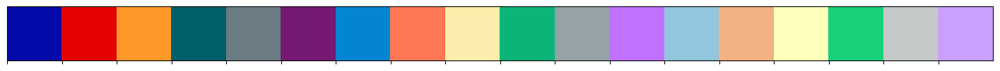

In [5]:
# palette = [ "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973", 
#             "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#c071fe", 
#             "#d1e5f0", "#fddbc7", "#ffffcb", "#12e193", "#d8dcd6", "#dfc5fe", 
#           ]
sns.palplot(sns.color_palette(palette[:18]))

In [ ]:
from classificationBinaires import initDictionnaireClassificateurs, executionEssaiComparaisonClassificateurs,\
                                   affichageEvolutionMetriques, affichageROC, executeValidationCroisee

In [7]:
from prjFormation import initProjet,affichageDonnees2d,affichageDonnees3d,createLinkageMatrix, afficheDendrogram,\
                         affichageDistribution,afficheColonneCible, add_median_labels, formatPct

In [8]:
font1 = fm.FontProperties(size=20)
font2 = fm.FontProperties(size=24)

warnings.filterwarnings(action="ignore")

if int(str(sns.__version__).split('.')[1]) > 8 : 
    plt.style.use('seaborn-v0_8-darkgrid')
else:
    plt.style.use('seaborn-darkgrid')
sns.set(font_scale=2)

In [9]:
projet = initProjet(repertoireRacine='.',nomProjet='BreastCancerWisconsin')

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Lecture des données</div></b>
<table>
        <tr>                                                                                   
             <th style='padding:15px;color:#030aa7;font-size:150%;text-align: left;font-weight: bold;font-family: Georgia, serif'>data.csv</th>
             <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/breast_cancer_logo.png" width="128"></th>
        </tr>  
<table>   
<table>
        <tr>                                                                                   
             <th  style="text-align:left;background-color:#053061;color:white;"> </th>
             <th  style="text-align:left;background-color:#053061;color:white;">Colonne initiale </th>
             <th  style="text-align:left;background-color:#053061;color:white;">Description</th>
        </tr>    
    <tr>
        <th  style="text-align:left"> </th>                            
        <th  style="text-align:left;font-style: italic">ID number</th> 
        <th  style="text-align:left;font-style: italic">index</th>
    </tr>    
    <tr>
        <th  style="text-align:left">0 </th>                            
        <th  style="text-align:left;color:red;font-style: italic">Diagnosis</th> 
        <th  style="text-align:left;color:red;font-style: italic">M = malignant, B = benign</th>
    </tr>    
    <tr>
        <th  style="text-align:left">1 </th>                            
        <th  style="text-align:left">radius </th>                            
        <th  style="text-align:left"></th>
    </tr>    
    <tr>
        <th  style="text-align:left">2 </th>                            
        <th  style="text-align:left">texture </th>                          
        <th  style="text-align:left">standard deviation of gray-scale values</th>
    </tr>    
    <tr>
        <th  style="text-align:left">3 </th>                            
        <th  style="text-align:left">perimeter </th>                         
        <th  style="text-align:left"></th>
    </tr>    
    <tr>
        <th  style="text-align:left">4 </th>                            
        <th  style="text-align:left">area</th>                               
        <th  style="text-align:left"></th>
    </tr> 
    <tr>
        <th  style="text-align:left">5 </th>                            
        <th  style="text-align:left">smoothness </th>                            
        <th  style="text-align:left">local variation in radius lengths</th>
    </tr>  
    <tr>
        <th  style="text-align:left">6 </th>                            
        <th  style="text-align:left">compactness </th>                      
        <th  style="text-align:left">$\frac{perimeter^2}{area - 1.0}$</th>
    </tr>    
    <tr>
        <th  style="text-align:left">7 </th>                            
        <th  style="text-align:left">concavity </th>              
        <th  style="text-align:left">severity of concave portions of the contour</th>
    </tr>  
    <tr>
        <th  style="text-align:left">8 </th>                            
        <th  style="text-align:left">concave points </th>                            
        <th  style="text-align:left">number of concave portions of the contour</th>
    </tr>   
    <tr>
        <th  style="text-align:left">9 </th>                            
        <th  style="text-align:left">symmetry </th>                           
        <th  style="text-align:left"></th>
    </tr> 
    <tr>
        <th  style="text-align:left">10 </th>                            
        <th  style="text-align:left">fractal dimension </th>                 
        <th  style="text-align:left">"coastline approximation" - 1</th>
    </tr>    
</table>

<div style='padding:15px;color:#030aa7;font-size:100%;text-align: left;font-family: Georgia, serif'>La moyenne, l’écart type et la « pire valeur » ou la plus grande (moyenne des trois valeurs les plus grandes) de ces variables ont été calculées pour chaque image, ce qui a donné lieu à 30 variables.</div>

In [10]:
donnees = pd.read_csv('../donnees/Breast Cancer Wisconsin (Diagnostic)/data.csv', index_col='id').drop(columns='Unnamed: 32')
donnees.sort_index(axis=1, inplace=True)
dictDiagnosis,dictRDiagnosis,dictLabels = {'M':1,'B':0},{1:'M',0:'B'},{1:'malignant',0:'benign'}

cible = 'diagnosis'

In [11]:
donnees.sample(5)

,area_mean,area_se,area_worst,compactness_mean,compactness_se,compactness_worst,concave points_mean,concave points_se,concave points_worst,concavity_mean,...,radius_worst,smoothness_mean,smoothness_se,smoothness_worst,symmetry_mean,symmetry_se,symmetry_worst,texture_mean,texture_se,texture_worst
id,,,,,,,,,,,,,,,,,,,,,
9112085,557.2,28.93,705.6,0.07426,0.01246,0.1421,0.03264,0.009128,0.07763,0.02819,...,15.05,0.09245,0.005841,0.1172,0.1375,0.01564,0.2196,30.72,1.9240,41.61
915691,556.7,33.67,844.4,0.14690,0.02265,0.3856,0.08172,0.013340,0.20510,0.14450,...,16.41,0.11060,0.005414,0.1574,0.2116,0.01705,0.3585,20.52,0.9306,29.66
866083,572.6,19.83,848.7,0.07862,0.01174,0.2884,0.03085,0.006880,0.13290,0.05285,...,16.89,0.09258,0.004088,0.1471,0.1761,0.01323,0.3470,24.69,1.0050,35.64
8810703,2499.0,525.60,2499.0,0.15160,0.02772,0.1516,0.15950,0.014070,0.15950,0.32010,...,28.11,0.11420,0.013450,0.1142,0.1648,0.04783,0.1648,18.47,1.4760,18.47
874858,609.9,31.72,762.4,0.24130,0.13540,0.9327,0.06618,0.016660,0.17720,0.19810,...,15.74,0.10750,0.007970,0.1533,0.2384,0.05113,0.5166,23.12,2.1100,37.18


>> <div style='padding:15px;color:#030aa7;background-color:#d8dcd6;font-size:120%;text-align: left;font-family: Georgia, serif'>Il n'y a pas de valeurs non renseignées</div>

In [12]:
donnees.isna().sum().sum()

0

In [13]:
donnees.describe().style.format("{:0.2f}") 

,area_mean,area_se,area_worst,compactness_mean,compactness_se,compactness_worst,concave points_mean,concave points_se,concave points_worst,concavity_mean,concavity_se,concavity_worst,fractal_dimension_mean,fractal_dimension_se,fractal_dimension_worst,perimeter_mean,perimeter_se,perimeter_worst,radius_mean,radius_se,radius_worst,smoothness_mean,smoothness_se,smoothness_worst,symmetry_mean,symmetry_se,symmetry_worst,texture_mean,texture_se,texture_worst
count,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00
mean,654.89,40.34,880.58,0.10,0.03,0.25,0.05,0.01,0.11,0.09,0.03,0.27,0.06,0.00,0.08,91.97,2.87,107.26,14.13,0.41,16.27,0.10,0.01,0.13,0.18,0.02,0.29,19.29,1.22,25.68
std,351.91,45.49,569.36,0.05,0.02,0.16,0.04,0.01,0.07,0.08,0.03,0.21,0.01,0.00,0.02,24.30,2.02,33.60,3.52,0.28,4.83,0.01,0.00,0.02,0.03,0.01,0.06,4.30,0.55,6.15
min,143.50,6.80,185.20,0.02,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.06,43.79,0.76,50.41,6.98,0.11,7.93,0.05,0.00,0.07,0.11,0.01,0.16,9.71,0.36,12.02
25%,420.30,17.85,515.30,0.06,0.01,0.15,0.02,0.01,0.06,0.03,0.02,0.11,0.06,0.00,0.07,75.17,1.61,84.11,11.70,0.23,13.01,0.09,0.01,0.12,0.16,0.02,0.25,16.17,0.83,21.08
50%,551.10,24.53,686.50,0.09,0.02,0.21,0.03,0.01,0.10,0.06,0.03,0.23,0.06,0.00,0.08,86.24,2.29,97.66,13.37,0.32,14.97,0.10,0.01,0.13,0.18,0.02,0.28,18.84,1.11,25.41
75%,782.70,45.19,1084.00,0.13,0.03,0.34,0.07,0.01,0.16,0.13,0.04,0.38,0.07,0.00,0.09,104.10,3.36,125.40,15.78,0.48,18.79,0.11,0.01,0.15,0.20,0.02,0.32,21.80,1.47,29.72
max,2501.00,542.20,4254.00,0.35,0.14,1.06,0.20,0.05,0.29,0.43,0.40,1.25,0.10,0.03,0.21,188.50,21.98,251.20,28.11,2.87,36.04,0.16,0.03,0.22,0.30,0.08,0.66,39.28,4.88,49.54


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Statistiques descriptives et analyse de données</div></b>

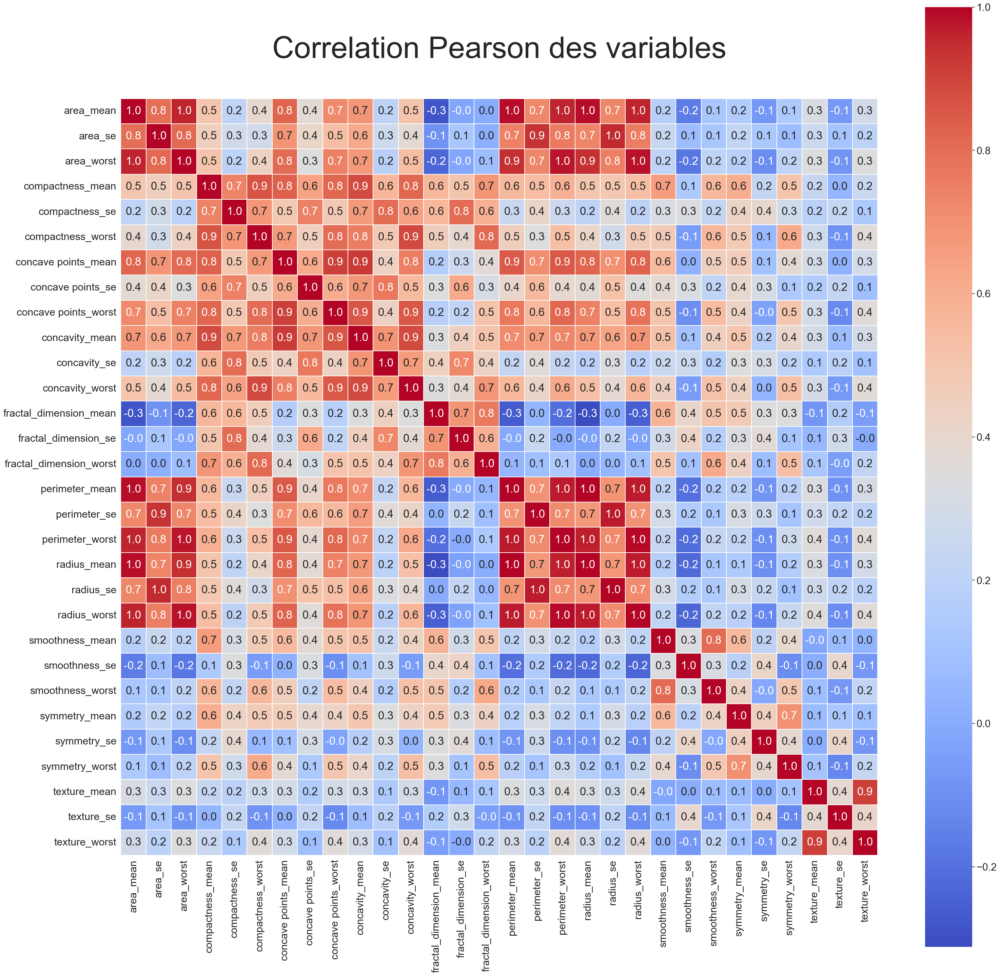

In [14]:
plt.figure(figsize=(36,36))
plt.title('Correlation Pearson des variables', y=1.05, size=64)
sns.heatmap(donnees.drop(columns=cible).corr(), fmt= '.1f',linewidths=0.3,vmax=1.0, 
            square=True, cmap='coolwarm', linecolor='white', annot=True);

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Separation des données pour l'apprentissage</div></b>

<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/classification/echantillonApprentissageTest.png" width="800">

In [15]:
X = donnees.drop(columns=cible)
y = donnees[cible].apply(lambda x: dictDiagnosis[x])

X_train, X_test, y_train, y_test = train_test_split( X, 
                                                     y, 
                                                     test_size=0.2, 
                                                     random_state=0, 
                                                     stratify = y
                                                   ) 
donnees.loc[X_train.index,'échantillon'] = 'apprentissage'
donnees.loc[X_test.index ,'échantillon'] = 'test'
donnees.to_parquet(os.path.join(projet.repertoireDonnees,'donnees_echantillons.parquet'))

In [16]:
donnees = pd.read_parquet(os.path.join(projet.repertoireDonnees,'donnees_echantillons.parquet'))
X_train, X_test = \
                  donnees.loc[donnees['échantillon']=='apprentissage',donnees.drop(columns=[cible,'échantillon']).columns],\
                  donnees.loc[donnees['échantillon']=='test',donnees.drop(columns=[cible,'échantillon']).columns]

y_train, y_test = \
                  donnees.loc[donnees['échantillon']=='apprentissage',cible].apply(lambda x: dictDiagnosis[x]),\
                  donnees.loc[donnees['échantillon']=='test',cible].apply(lambda x: dictDiagnosis[x])

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((455, 30), (114, 30), (455,), (114,))

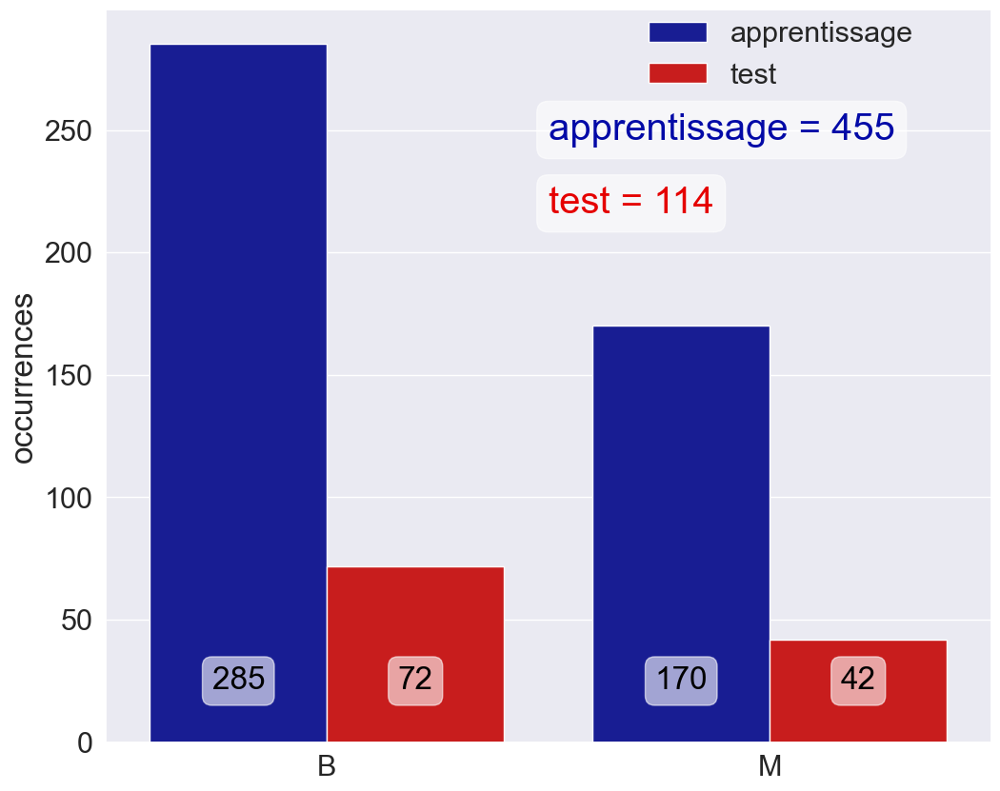

In [17]:
plt.figure(figsize=(12,10))
graph = sns.countplot(x=cible,
                      hue='échantillon',
                      data=donnees.sort_values([cible,'échantillon']), 
                      palette=palette
                     );

for i,nb in enumerate(donnees.groupby([cible,'échantillon'])[cible].count()):
    if i%2 == 0 : val = i/2
    delta =  val - 0.2 +(i%2)*0.4
    graph.text(
                delta ,
                25,
                nb,
                color='black',
#                 rotation='vertical',
#                 size='large',
#                 fontsize='large',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='center',
               )
affichage = donnees.groupby('échantillon').agg({'diagnosis':'count'})
graph.text(
                0.5 ,
                250,
                f"apprentissage = {affichage.loc['apprentissage','diagnosis']}",
                color="#030aa7",
                fontsize='large',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='left',
               )
graph.text(
                0.5 ,
                220,
                f"test = {affichage.loc['test','diagnosis']}",
                color="#e50000",
                fontsize='large',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='left',
               )

graph.set_ylabel('occurrences');
graph.set_xlabel('');
graph.legend(bbox_to_anchor=(.6, 1), loc='upper left', borderaxespad=0);

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Déclaration des classificateurs </div></b>

In [18]:
classificateursDict =  initDictionnaireClassificateurs(arbres=12)
classificateursDict.pop('LightGBM'),\
classificateursDict.pop('XGBoost'),\
classificateursDict.pop('Stochastic_GD')

(LGBMClassifier(min_child_samples=10, min_split_gain=0.01, n_estimators=12,
                num_leaves=20, reg_alpha=0.1, reg_lambda=20),
 XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='auc', feature_types=None,
               gamma=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=6, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=12, n_jobs=None,
               num_parallel_tree=None, random_state=None, ...),
 SGDClassifier(alpha=0.01, loss='log', max_iter=200))

In [19]:
classificateursDict

{'Random_Forest': RandomForestClassifier(max_depth=6, max_features=3, min_samples_split=4,
                        n_estimators=12, n_jobs=-1),
 'AdaBoost': AdaBoostClassifier(n_estimators=12),
 'LogisticRegression': LogisticRegression(C=0.81113, max_iter=3000, n_jobs=-1),
 'Gaussian_Process': GaussianProcessClassifier(n_jobs=-1),
 'Nearest_Neighbors': KNeighborsClassifier(algorithm='ball_tree', n_jobs=-1, n_neighbors=17, p=1,
                      weights='distance'),
 'Linear_SVM': SVC(C=1, kernel='linear', probability=True),
 'Radial_NuSVM': NuSVC(gamma=0.5, nu=0.195, probability=True),
 'Poly_NuSVM': NuSVC(kernel='poly', nu=0.1, probability=True),
 'GaussianNaiveBayes': GaussianNB(),
 'QuadraticDiscriminant': QuadraticDiscriminantAnalysis(),
 'Neural_Net': MLPClassifier(alpha=1)}

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Essai initial avec les donnes sans aucun traitement</div></b> 

AdaBoost               0.9386	--	Area under the ROC curve : 0.9851	--	Exécution  :.07s
GaussianNaiveBayes     0.9211	--	Area under the ROC curve : 0.9835	--	Exécution  :.02s
Gaussian_Process       0.7105	--	Area under the ROC curve : 0.5417	--	Exécution  :.09s
 0.9649	--	Area under the ROC curve : 0.9954	--	Exécution  :5.32s
 0.9561	--	Area under the ROC curve : 0.9937	--	Exécution  :2.53s
Nearest_Neighbors      0.9474	--	Area under the ROC curve : 0.9780	--	Exécution  :.07s
 0.9474	--	Area under the ROC curve : 0.9818	--	Exécution  :.30s
Poly_NuSVM             0.6667	--	Area under the ROC curve : 0.8075	--	Exécution  :.06s
QuadraticDiscriminant  0.9561	--	Area under the ROC curve : 0.9850	--	Exécution  :.02s
 0.6316	--	Area under the ROC curve : 0.4514	--	Exécution  :.18s
Random_Forest          0.9474	--	Area under the ROC curve : 0.9760	--	Exécution  :.09s


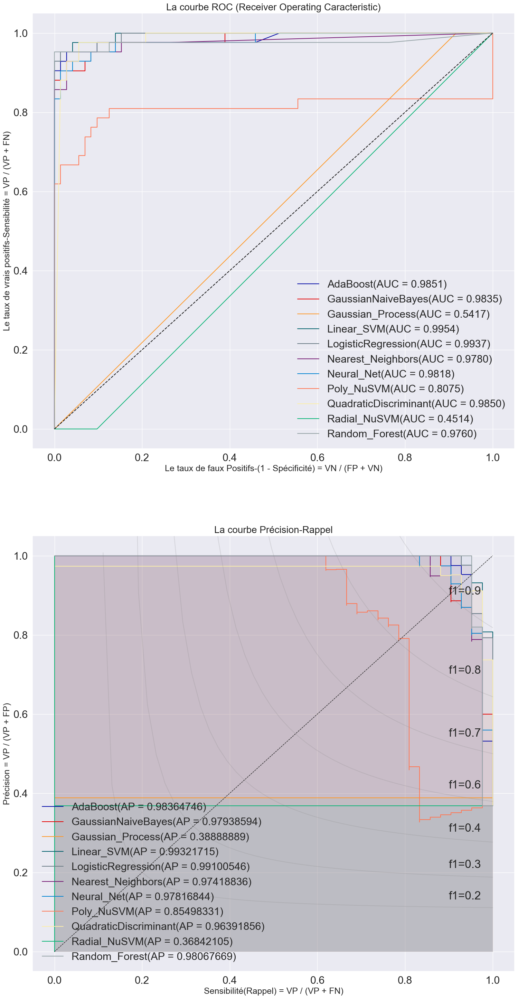

Exécution  :10.84s


In [20]:
resultats = executionEssaiComparaisonClassificateurs(classificateursDict, 
                                                     X_train, 
                                                     y_train,
                                                     X_test, 
                                                     y_test, 
                                                     couleurs = palette[:len(classificateursDict.keys())],
                                                     nom_essai = 'Initial', 
                                                     projet=projet)

AdaBoost          93.8596	--	Area under the ROC curve : 0.9851	--	

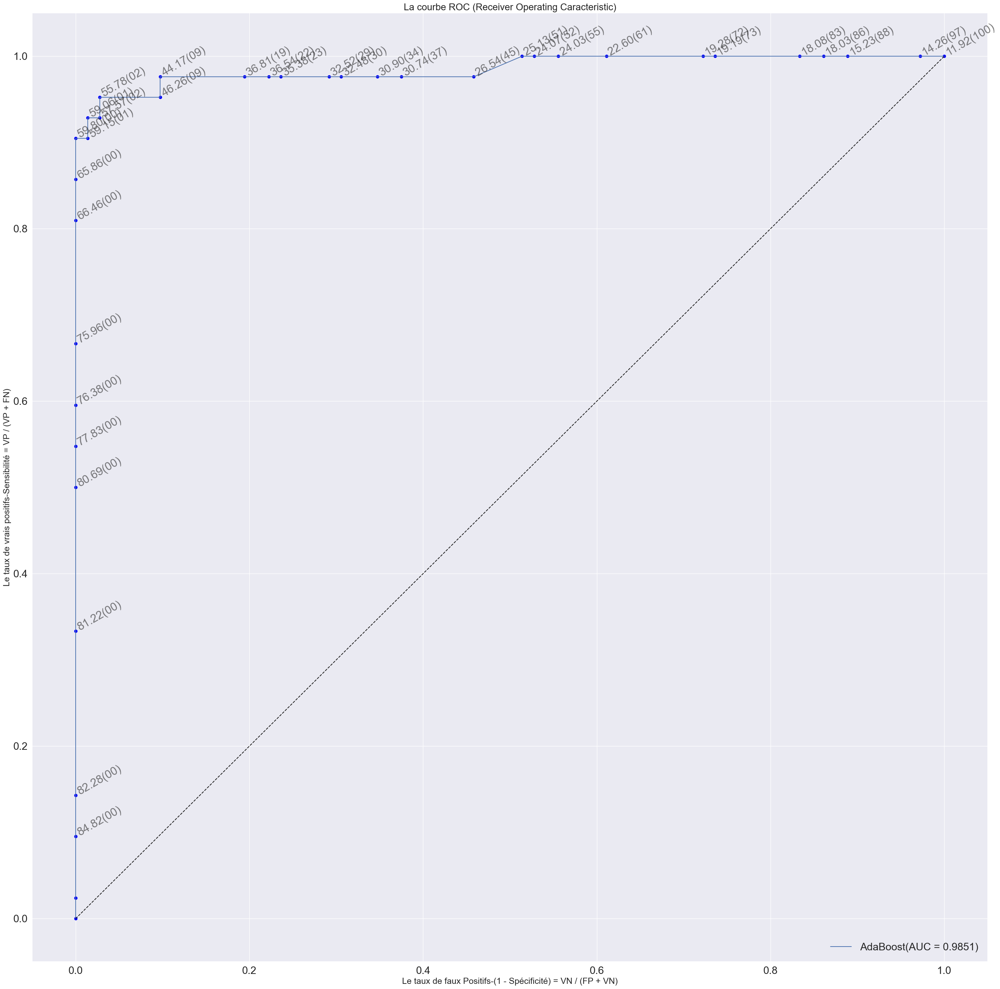

In [21]:
affichageROC('AdaBoost', classificateursDict['AdaBoost'], X_test, y_test)

In [22]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
Linear_SVM,0.995370,0.993217,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,Initial
LogisticRegression,0.993717,0.991005,0.956140,0.941176,0.930233,0.952381,0.958333,1.580862,0.043860,0.888889,Initial
AdaBoost,0.985119,0.983647,0.938596,0.919540,0.888889,0.952381,0.930556,2.213207,0.061404,0.851064,Initial
QuadraticDiscriminant,0.984954,0.963919,0.956140,0.942529,0.911111,0.976190,0.944444,1.580862,0.043860,0.891304,Initial
GaussianNaiveBayes,0.983466,0.979386,0.921053,0.894118,0.883721,0.904762,0.930556,2.845552,0.078947,0.808511,Initial
Neural_Net,0.981812,0.978168,0.947368,0.926829,0.950000,0.904762,0.972222,1.897034,0.052632,0.863636,Initial
Nearest_Neighbors,0.978009,0.974188,0.947368,0.926829,0.950000,0.904762,0.972222,1.897034,0.052632,0.863636,Initial
Random_Forest,0.976025,0.980677,0.947368,0.930233,0.909091,0.952381,0.944444,1.897034,0.052632,0.869565,Initial
Poly_NuSVM,0.807540,0.854983,0.666667,0.173913,1.000000,0.095238,1.000000,12.014551,0.333333,0.095238,Initial


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Centrage et réduction des données</div></b> 

<table>
<tr>
<th><img src="https://raw.githubusercontent.com/rbizoi/IntelligenceEnDonneesDeSante/refs/heads/main/images/moyenne.png"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/IntelligenceEnDonneesDeSante/refs/heads/main/images/ecart_type.png"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/IntelligenceEnDonneesDeSante/refs/heads/main/images/centrage_reduction.png"></th>
</tr>
</table>

In [23]:
modelStd = StandardScaler()
modelStd.fit(X_train)

StandardScaler()

In [24]:
X_train[X_train.columns] = modelStd.transform(X_train)
X_test[X_test.columns] = modelStd.transform(X_test)

AdaBoost               0.9386	--	Area under the ROC curve : 0.9851	--	Exécution  :.11s
GaussianNaiveBayes     0.9035	--	Area under the ROC curve : 0.9792	--	Exécution  :.04s
 0.9386	--	Area under the ROC curve : 0.9458	--	Exécution  :.11s
Linear_SVM             0.9474	--	Area under the ROC curve : 0.9937	--	Exécution  :.05s
 0.9737	--	Area under the ROC curve : 0.9931	--	Exécution  :1.73s
Nearest_Neighbors      0.9386	--	Area under the ROC curve : 0.9868	--	Exécution  :.06s
 0.9649	--	Area under the ROC curve : 0.9931	--	Exécution  :.52s
Poly_NuSVM             0.9825	--	Area under the ROC curve : 0.9960	--	Exécution  :.05s
QuadraticDiscriminant  0.9561	--	Area under the ROC curve : 0.9850	--	Exécution  :.05s
 0.8246	--	Area under the ROC curve : 0.9425	--	Exécution  :.14s
Random_Forest          0.9474	--	Area under the ROC curve : 0.9772	--	Exécution  :.08s


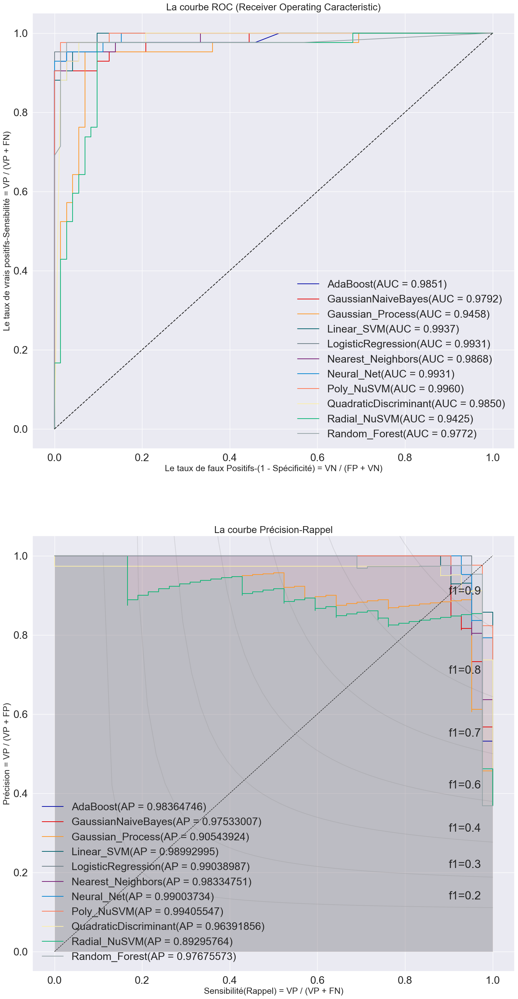

Exécution  :4.79s


In [25]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict, 
                                                        X_train, 
                                                        y_train, 
                                                        X_test, 
                                                        y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='StandardScaler', 
                                                        projet=projet)

AdaBoost          93.8596	--	Area under the ROC curve : 0.9851	--	

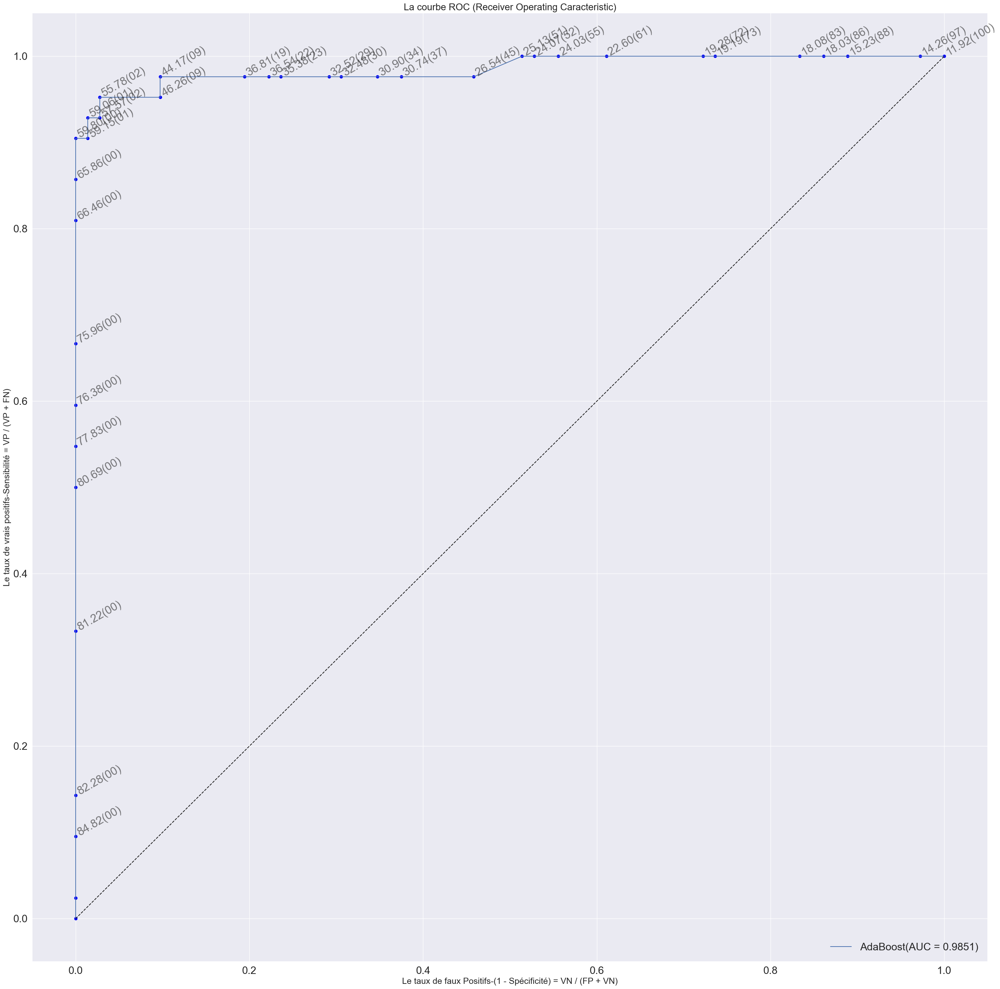

In [26]:
affichageROC('AdaBoost', classificateursDict['AdaBoost'], X_test, y_test)

In [27]:
resultats = pd.concat([resultats,resultatsTemp])

In [28]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
Linear_SVM,0.995370,0.993217,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,Initial
LogisticRegression,0.993717,0.991005,0.956140,0.941176,0.930233,0.952381,0.958333,1.580862,0.043860,0.888889,Initial
Linear_SVM,0.993717,0.989930,0.947368,0.925000,0.973684,0.880952,0.986111,1.897034,0.052632,0.860465,StandardScaler
Neural_Net,0.993056,0.990037,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,StandardScaler
LogisticRegression,0.993056,0.990390,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler
Nearest_Neighbors,0.986772,0.983348,0.938596,0.917647,0.906977,0.928571,0.944444,2.213207,0.061404,0.847826,StandardScaler
AdaBoost,0.985119,0.983647,0.938596,0.919540,0.888889,0.952381,0.930556,2.213207,0.061404,0.851064,Initial
AdaBoost,0.985119,0.983647,0.938596,0.919540,0.888889,0.952381,0.930556,2.213207,0.061404,0.851064,StandardScaler


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Choix simple de variables SE WORST</div></b> 

AdaBoost               0.9561	--	Area under the ROC curve : 0.9909	--	Exécution  :.08s
GaussianNaiveBayes     0.9211	--	Area under the ROC curve : 0.9798	--	Exécution  :.03s
 0.9561	--	Area under the ROC curve : 0.9613	--	Exécution  :.09s
Linear_SVM             0.9561	--	Area under the ROC curve : 0.9950	--	Exécution  :.03s
 0.9737	--	Area under the ROC curve : 0.9937	--	Exécution  :1.46s
Nearest_Neighbors      0.9561	--	Area under the ROC curve : 0.9798	--	Exécution  :.07s
 0.9649	--	Area under the ROC curve : 0.9937	--	Exécution  :.41s
Poly_NuSVM             0.9737	--	Area under the ROC curve : 0.9957	--	Exécution  :.05s
QuadraticDiscriminant  0.9474	--	Area under the ROC curve : 0.9833	--	Exécution  :.02s
Radial_NuSVM           0.8947	--	Area under the ROC curve : 0.9583	--	Exécution  :.09s
 0.9474	--	Area under the ROC curve : 0.9833	--	Exécution  :.10s


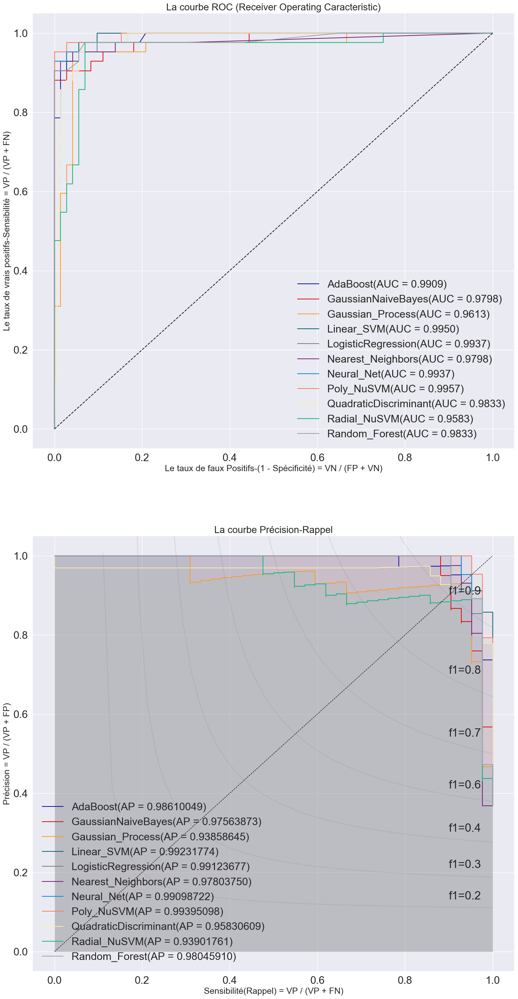

Exécution  :4.40s


In [29]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict=classificateursDict, 
                                                        X_train=X_train.filter(regex='(se|worst)$', axis=1), 
                                                        y_train=y_train,
                                                        X_test=X_test.filter(regex='(se|worst)$', axis=1), 
                                                        y_test=y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='ChoixVarSE+W', 
                                                        projet=projet)

Linear_SVM        95.6140	--	Area under the ROC curve : 0.9950	--	

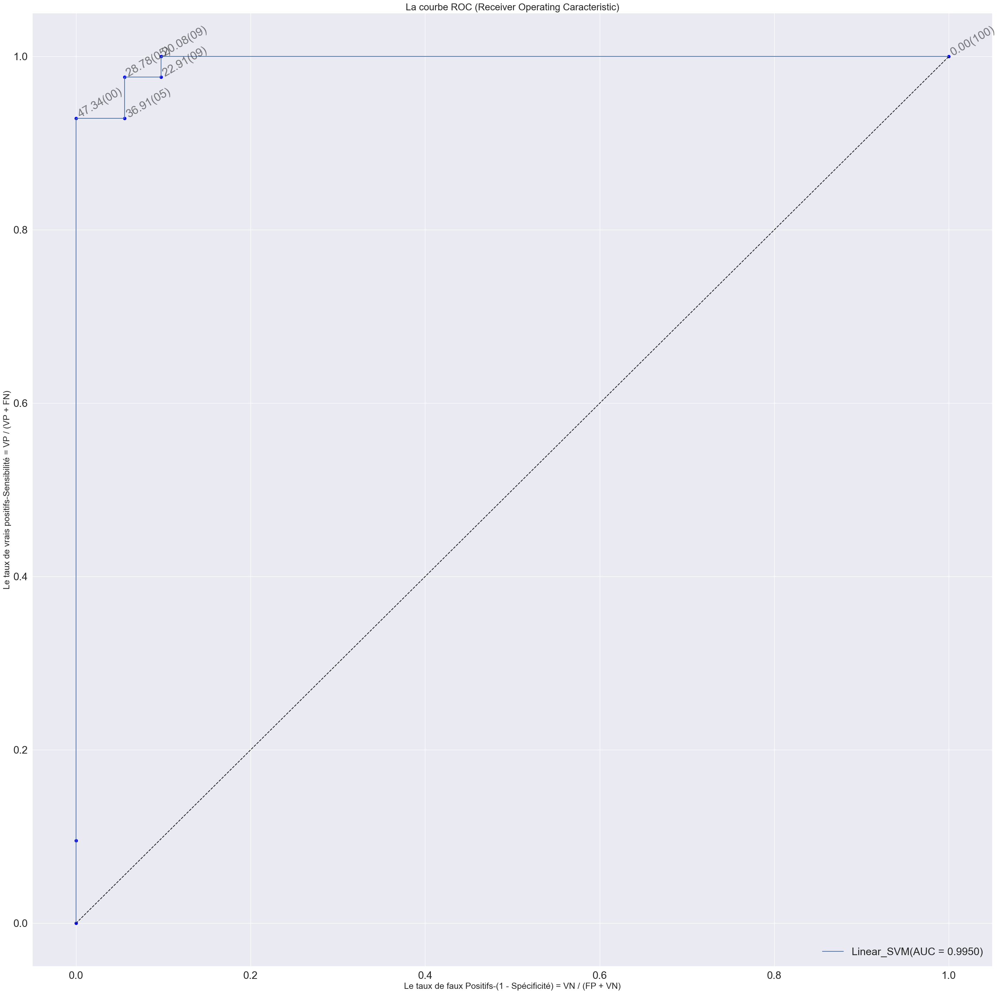

In [30]:
affichageROC('Linear_SVM', classificateursDict['Linear_SVM'], X_test.filter(regex='(se|worst)$', axis=1), y_test)

In [31]:
resultats = pd.concat([resultats,resultatsTemp])

In [32]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
Linear_SVM,0.995370,0.993217,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,Initial
Linear_SVM,0.995040,0.992318,0.956140,0.939759,0.951220,0.928571,0.972222,1.580862,0.043860,0.886364,ChoixVarSE+W
Neural_Net,0.993717,0.990987,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,ChoixVarSE+W
LogisticRegression,0.993717,0.991237,0.973684,0.962963,1.000000,0.928571,1.000000,0.948517,0.026316,0.928571,ChoixVarSE+W
Linear_SVM,0.993717,0.989930,0.947368,0.925000,0.973684,0.880952,0.986111,1.897034,0.052632,0.860465,StandardScaler
LogisticRegression,0.993717,0.991005,0.956140,0.941176,0.930233,0.952381,0.958333,1.580862,0.043860,0.888889,Initial
LogisticRegression,0.993056,0.990390,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Choix simple de variables WORST</div></b> 

AdaBoost               0.9474	--	Area under the ROC curve : 0.9906	--	Exécution  :.09s
GaussianNaiveBayes     0.9211	--	Area under the ROC curve : 0.9808	--	Exécution  :.02s
 0.9386	--	Area under the ROC curve : 0.9759	--	Exécution  :.12s
Linear_SVM             0.9474	--	Area under the ROC curve : 0.9947	--	Exécution  :.04s
 0.9474	--	Area under the ROC curve : 0.9947	--	Exécution  :1.41s
Nearest_Neighbors      0.9474	--	Area under the ROC curve : 0.9815	--	Exécution  :.06s
 0.9474	--	Area under the ROC curve : 0.9944	--	Exécution  :.39s
Poly_NuSVM             0.9298	--	Area under the ROC curve : 0.9868	--	Exécution  :.05s
QuadraticDiscriminant  0.9474	--	Area under the ROC curve : 0.9833	--	Exécution  :.02s
Radial_NuSVM           0.9211	--	Area under the ROC curve : 0.9798	--	Exécution  :.09s
 0.9474	--	Area under the ROC curve : 0.9775	--	Exécution  :.11s


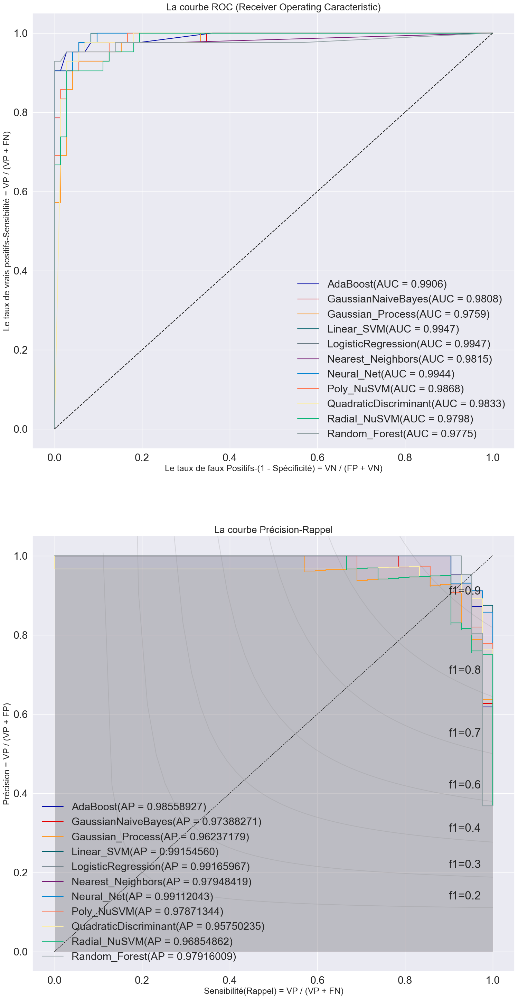

Exécution  :4.25s


In [33]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict=classificateursDict, 
                                                        X_train=X_train.filter(regex='(worst)$', axis=1), 
                                                        y_train=y_train,
                                                        X_test=X_test.filter(regex='(worst)$', axis=1), 
                                                        y_test=y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='ChoixVarW', 
                                                        projet=projet)

Neural_Net        94.7368	--	Area under the ROC curve : 0.9944	--	

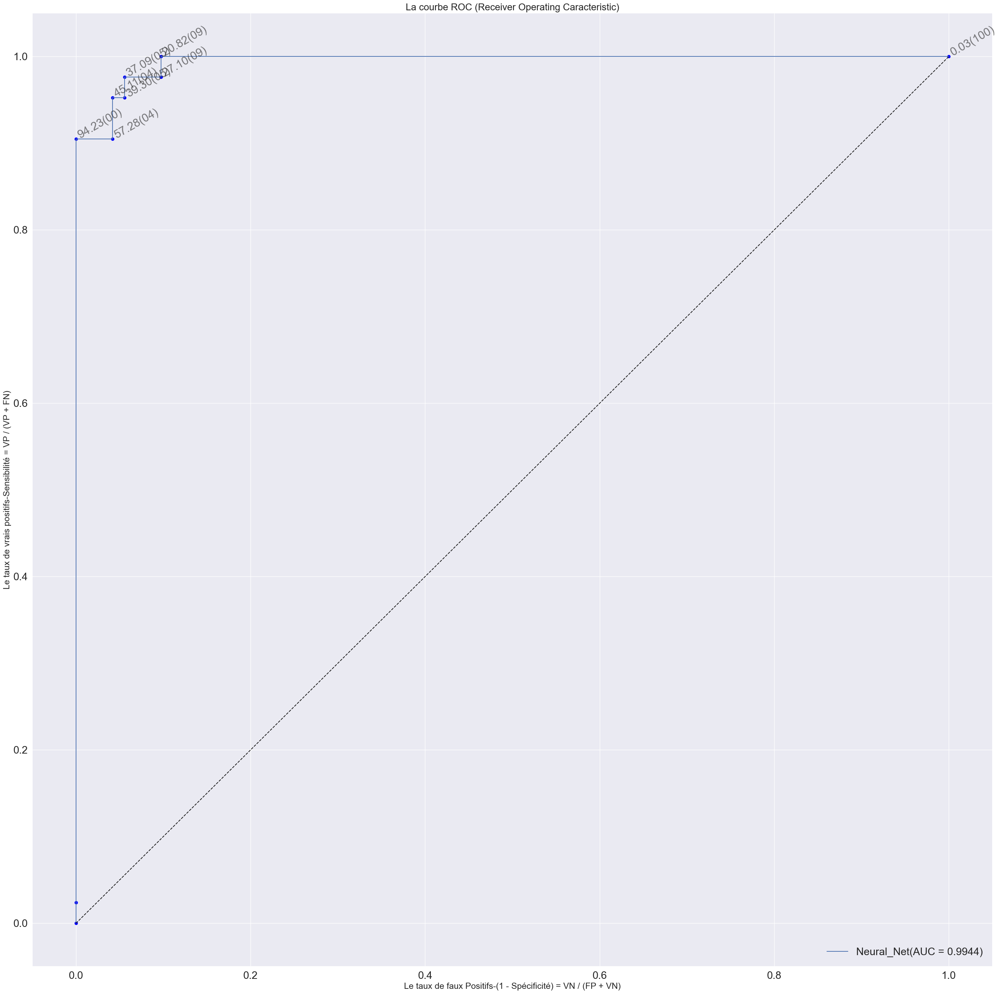

In [34]:
affichageROC('Neural_Net', classificateursDict['Neural_Net'], X_test.filter(regex='(worst)$', axis=1), y_test)

In [35]:
resultats = pd.concat([resultats,resultatsTemp])

In [36]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
Linear_SVM,0.995370,0.993217,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,Initial
Linear_SVM,0.995040,0.992318,0.956140,0.939759,0.951220,0.928571,0.972222,1.580862,0.043860,0.886364,ChoixVarSE+W
Linear_SVM,0.994709,0.991546,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
LogisticRegression,0.994709,0.991660,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
Neural_Net,0.994378,0.991120,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
Neural_Net,0.993717,0.990987,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,ChoixVarSE+W
LogisticRegression,0.993717,0.991237,0.973684,0.962963,1.000000,0.928571,1.000000,0.948517,0.026316,0.928571,ChoixVarSE+W


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Analyse en composantes principales</div></b> 

nombre des dimensions = 10


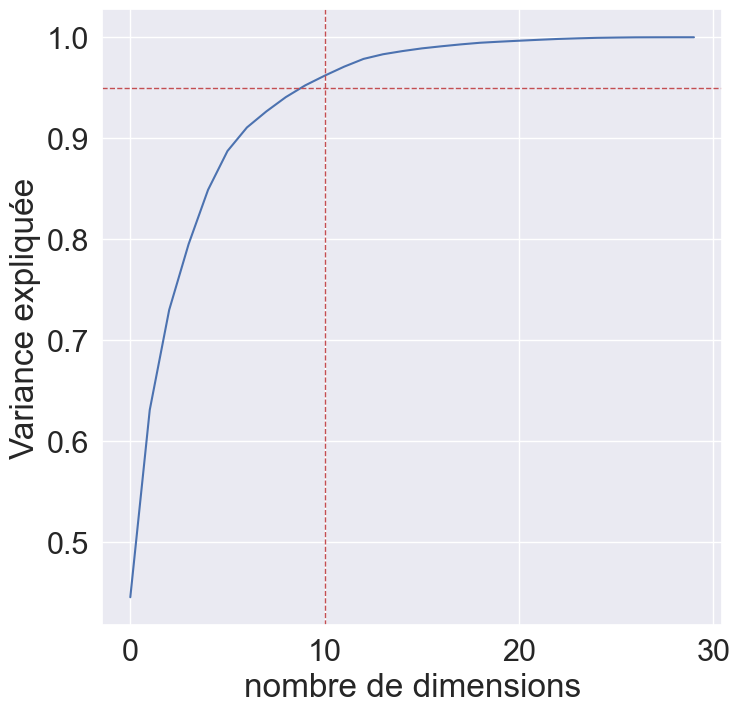

In [37]:
modelACP = PCA().fit(X_train)
plt.figure(figsize=(8,8))
plt.plot(np.cumsum(modelACP.explained_variance_ratio_))
nombreDim = sum(modelACP.explained_variance_ratio_.cumsum() < .95) + 1
plt.axvline(nombreDim, 0, 1, linewidth=1, ls='--', color='r');
plt.axhline(0.95, 0, 1, linewidth=1, ls='--', color='r');
plt.xlabel('nombre de dimensions')
plt.ylabel('Variance expliquée');
print(f'nombre des dimensions = {nombreDim}')

In [38]:
modelACP = PCA(nombreDim).fit(X_train)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((455, 30), (114, 30), (455,), (114,))

In [39]:
X_train, X_test = modelACP.transform(X_train),modelACP.transform(X_test)

AdaBoost               0.8947	--	Area under the ROC curve : 0.9792	--	Exécution  :.08s
GaussianNaiveBayes     0.9035	--	Area under the ROC curve : 0.9699	--	Exécution  :.03s
 0.9386	--	Area under the ROC curve : 0.9494	--	Exécution  :.09s
Linear_SVM             0.9474	--	Area under the ROC curve : 0.9924	--	Exécution  :.05s
 0.9474	--	Area under the ROC curve : 0.9924	--	Exécution  :1.42s
Nearest_Neighbors      0.9474	--	Area under the ROC curve : 0.9868	--	Exécution  :.05s
 0.9561	--	Area under the ROC curve : 0.9917	--	Exécution  :.39s
Poly_NuSVM             0.9737	--	Area under the ROC curve : 0.9940	--	Exécution  :.03s
QuadraticDiscriminant  0.9561	--	Area under the ROC curve : 0.9878	--	Exécution  :.02s
Radial_NuSVM           0.9123	--	Area under the ROC curve : 0.9464	--	Exécution  :.11s
 0.9123	--	Area under the ROC curve : 0.9517	--	Exécution  :.10s


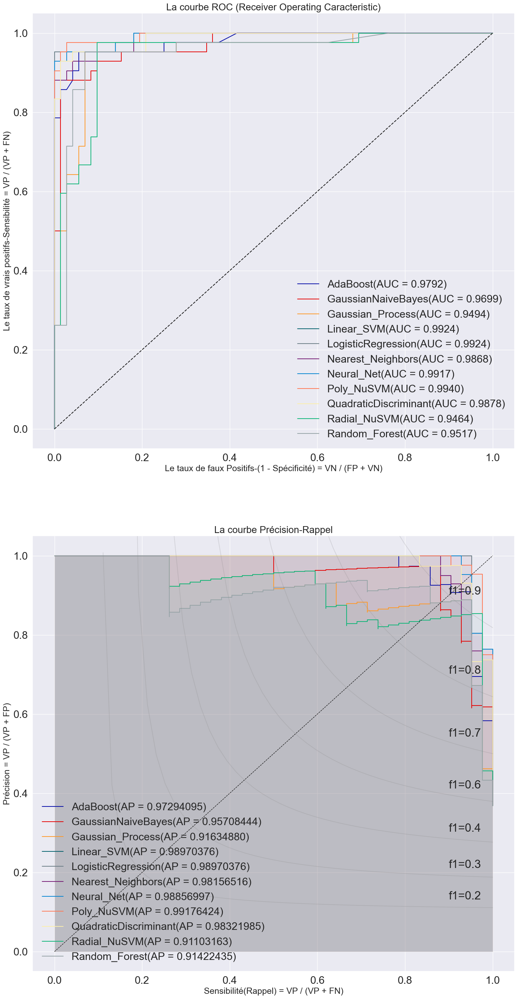

Exécution  :4.19s


In [40]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict=classificateursDict, 
                                                        X_train=X_train, 
                                                        y_train=y_train,
                                                        X_test=X_test, 
                                                        y_test=y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='TransformationACP', 
                                                        projet=projet)

Linear_SVM        94.7368	--	Area under the ROC curve : 0.9924	--	

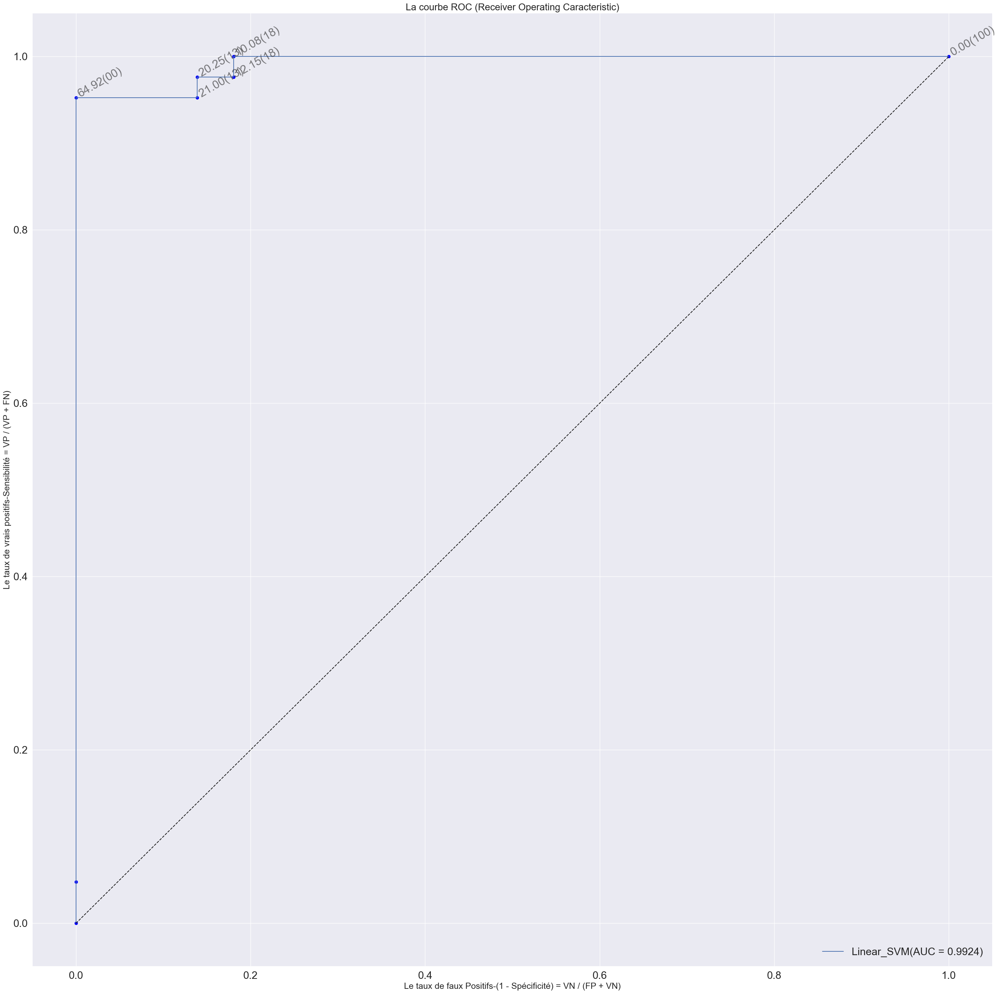

In [41]:
affichageROC('Linear_SVM', classificateursDict['Linear_SVM'], X_test, y_test)

In [42]:
resultats = pd.concat([resultats,resultatsTemp])

In [43]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
Linear_SVM,0.995370,0.993217,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,Initial
Linear_SVM,0.995040,0.992318,0.956140,0.939759,0.951220,0.928571,0.972222,1.580862,0.043860,0.886364,ChoixVarSE+W
Linear_SVM,0.994709,0.991546,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
LogisticRegression,0.994709,0.991660,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
Neural_Net,0.994378,0.991120,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
Poly_NuSVM,0.994048,0.991764,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,TransformationACP
Neural_Net,0.993717,0.990987,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,ChoixVarSE+W


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Discrétisation quantile 100</div></b> 

In [44]:
donnees_ft = donnees.copy()
for colonne in  ['area_worst', 'compactness_worst', 
                'fractal_dimension_worst', 'perimeter_worst',
                'radius_worst', 'smoothness_worst', 'symmetry_worst', 'texture_worst'] :
    donnees_ft[f'{colonne}Q100'] = pd.qcut(donnees_ft[colonne],100,labels=False)    

In [45]:
donnees_ft.filter(regex='Q100$', axis=1).columns

Index(['area_worstQ100', 'compactness_worstQ100',
       'fractal_dimension_worstQ100', 'perimeter_worstQ100',
       'radius_worstQ100', 'smoothness_worstQ100', 'symmetry_worstQ100',
       'texture_worstQ100'],
      dtype='object')

In [46]:
X_train, X_test = \
                  donnees_ft.loc[donnees_ft['échantillon']=='apprentissage',donnees_ft.filter(regex='Q100$', axis=1).columns],\
                  donnees_ft.loc[donnees_ft['échantillon']=='test',donnees_ft.filter(regex='Q100$', axis=1).columns]

y_train, y_test = \
                  donnees_ft.loc[donnees_ft['échantillon']=='apprentissage',cible].apply(lambda x: dictDiagnosis[x]),\
                  donnees_ft.loc[donnees_ft['échantillon']=='test',cible].apply(lambda x: dictDiagnosis[x])

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((455, 8), (114, 8), (455,), (114,))

AdaBoost               0.9386	--	Area under the ROC curve : 0.9881	--	Exécution  :.06s
GaussianNaiveBayes     0.9211	--	Area under the ROC curve : 0.9878	--	Exécution  :.03s
Gaussian_Process       0.8596	--	Area under the ROC curve : 0.5000	--	Exécution  :.09s
 0.9561	--	Area under the ROC curve : 0.9950	--	Exécution  :.95s
 0.9649	--	Area under the ROC curve : 0.9967	--	Exécution  :1.43s
Nearest_Neighbors      0.9474	--	Area under the ROC curve : 0.9894	--	Exécution  :.05s
 0.8333	--	Area under the ROC curve : 0.9233	--	Exécution  :.41s
Poly_NuSVM             0.9561	--	Area under the ROC curve : 0.9954	--	Exécution  :.05s
QuadraticDiscriminant  0.9035	--	Area under the ROC curve : 0.9679	--	Exécution  :.03s
 0.6316	--	Area under the ROC curve : 0.5000	--	Exécution  :.19s
Random_Forest          0.9737	--	Area under the ROC curve : 0.9773	--	Exécution  :.08s


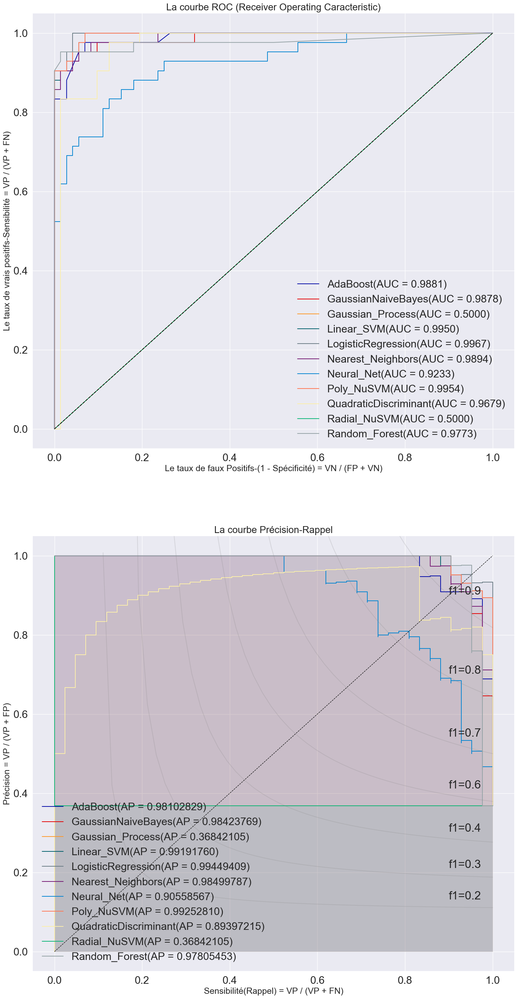

Exécution  :5.15s


In [47]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict=classificateursDict, 
                                                        X_train=X_train, 
                                                        y_train=y_train,
                                                        X_test=X_test, 
                                                        y_test=y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='VariableQ100', 
                                                        projet=projet)

LogisticRegression 96.4912	--	Area under the ROC curve : 0.9967	--	

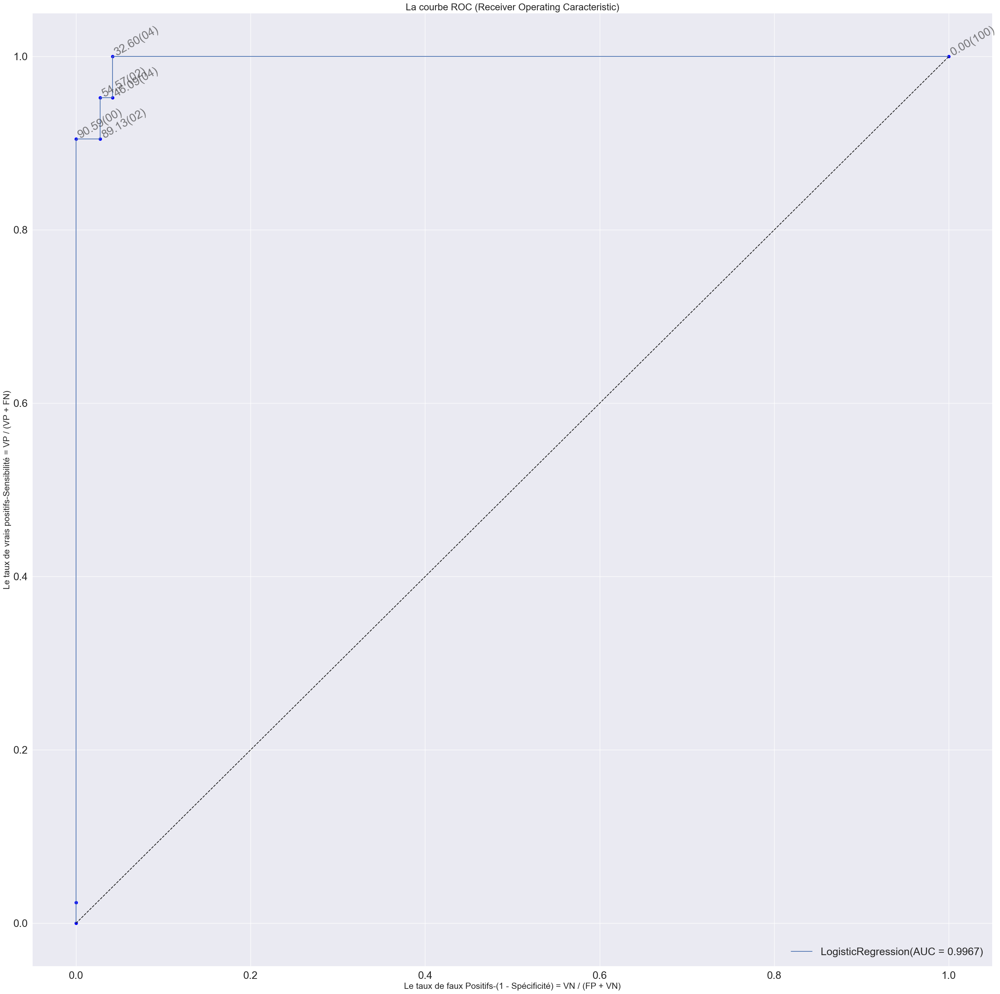

In [48]:
affichageROC('LogisticRegression', classificateursDict['LogisticRegression'], X_test, y_test)

In [49]:
resultats = pd.concat([resultats,resultatsTemp])

In [50]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
LogisticRegression,0.996693,0.994494,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,VariableQ100
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
Linear_SVM,0.995370,0.993217,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,Initial
Poly_NuSVM,0.995370,0.992528,0.956140,0.939759,0.951220,0.928571,0.972222,1.580862,0.043860,0.886364,VariableQ100
Linear_SVM,0.995040,0.992318,0.956140,0.939759,0.951220,0.928571,0.972222,1.580862,0.043860,0.886364,ChoixVarSE+W
Linear_SVM,0.995040,0.991918,0.956140,0.939759,0.951220,0.928571,0.972222,1.580862,0.043860,0.886364,VariableQ100
Linear_SVM,0.994709,0.991546,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
LogisticRegression,0.994709,0.991660,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW


In [51]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('f1',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
Poly_NuSVM,0.994048,0.991764,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,TransformationACP
LogisticRegression,0.993056,0.990390,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler
Random_Forest,0.977348,0.978055,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,VariableQ100
LogisticRegression,0.993717,0.991237,0.973684,0.962963,1.000000,0.928571,1.000000,0.948517,0.026316,0.928571,ChoixVarSE+W
Linear_SVM,0.995370,0.993217,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,Initial
Neural_Net,0.993717,0.990987,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,ChoixVarSE+W
LogisticRegression,0.996693,0.994494,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,VariableQ100


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des évolutions des métriques dans les essais</div></b> 

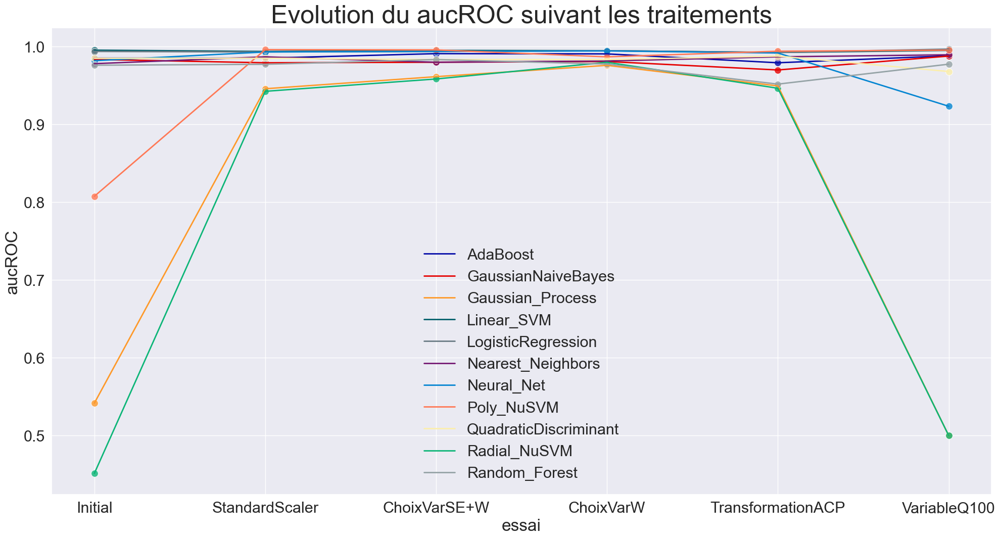

In [52]:
affichageEvolutionMetriques(resultats, metrique='aucROC', palette=palette)

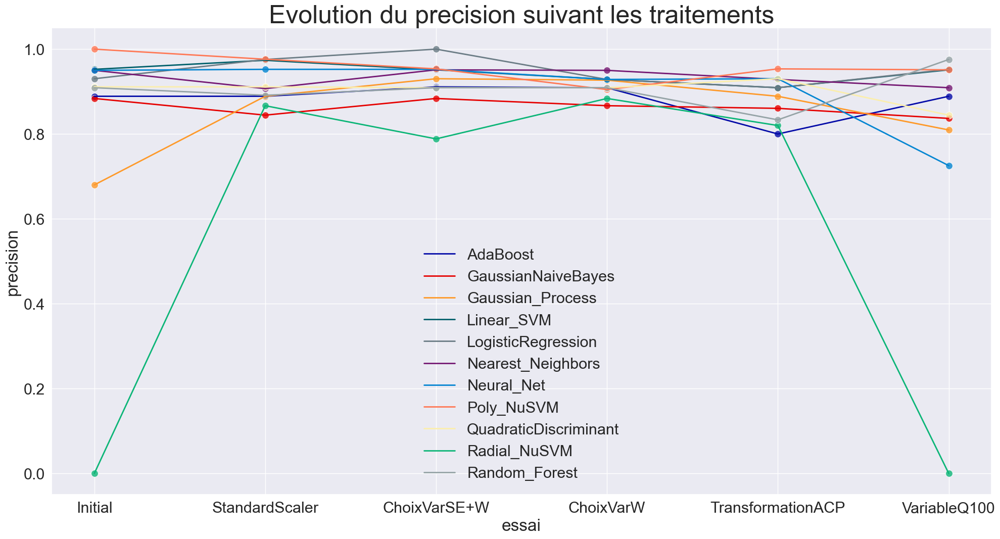

In [53]:
affichageEvolutionMetriques(resultats, metrique='precision', palette=palette)

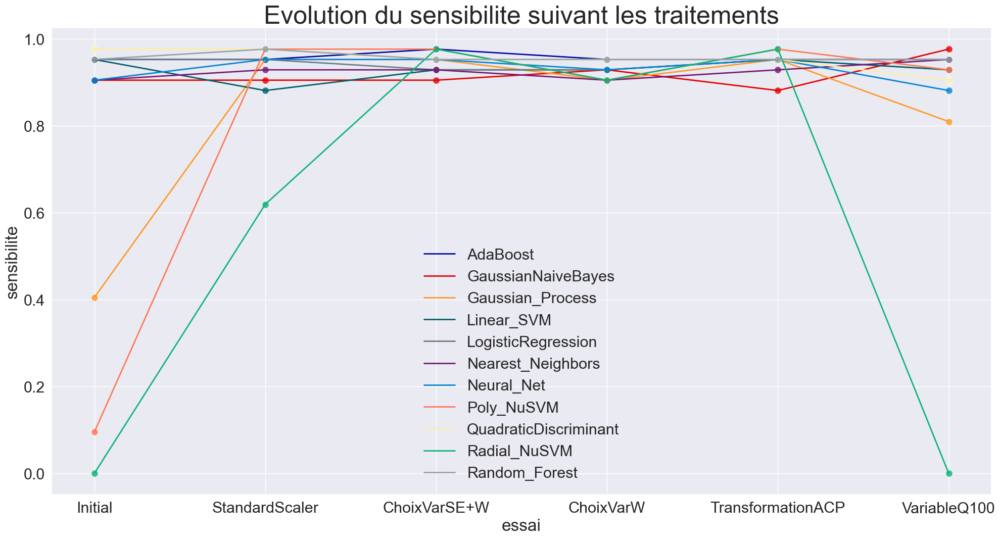

In [54]:
affichageEvolutionMetriques(resultats, metrique='sensibilite', palette=palette)

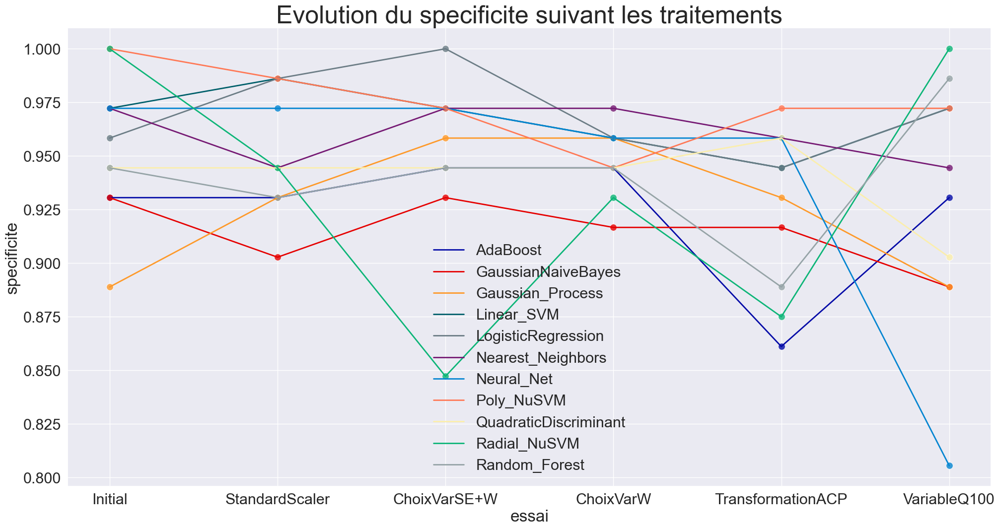

In [55]:
affichageEvolutionMetriques(resultats, metrique='specificite', palette=palette)

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Optimisation des classificateurs</div></b> 

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>LogisticRegression - VariableQ100</div></b> 

In [56]:
X = donnees_ft.loc[:,donnees_ft.filter(regex='Q100$', axis=1).columns]
y = donnees_ft.loc[:,cible].apply(lambda x: dictDiagnosis[x])

nom = 'LogisticRegression'

cv_sets = ShuffleSplit(random_state=101)

# param_grid={
#       'C'                    : np.logspace(-10,10,10), 
#       'penalty'               : ['l1','l2']#,# l1 lasso l2 ridge
#      # 'solver'                : ['lbfgs', 'liblinear', 'sag', 'saga']
#      }

param_grid=[
                {
                    'C'       : np.logspace(-1, 2, 20),
                    'penalty' : ['l2'],
                    'solver'  : ['lbfgs', 'newton-cg', 'sag', 'saga']
                },
                {
                    'C'       : np.logspace(-1, 2, 20),
                    'penalty' : ['l1'],
                    'solver'  : ['liblinear', 'saga']
                },
            ]



scoring = make_scorer(f1_score)

classifieur = LogisticRegression(max_iter=3000, n_jobs=-1)

gridCV = GridSearchCV( 
                         estimator=classifieur,
                         param_grid = param_grid, 
                         scoring=scoring,  
                         cv=cv_sets,  
                         refit='AUC', 
                         return_train_score=True
                      )

t0 = time.time()
gridCV.fit(X,y)

print("Les paramètres optimaux %s avec un score de %.8f" % ( gridCV.best_params_, gridCV.best_score_))
print('Exécution  :'+('%.2fs' % (time.time() - t0)).lstrip('0'))
classificateursDict[nom] = gridCV.best_estimator_

Les paramètres optimaux {'C': 0.29763514416313175, 'penalty': 'l1', 'solver': 'liblinear'} avec un score de 0.95273334
Exécution  :168.00s


## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Random_Forest - VariableQ100</div></b> 

In [57]:
nom = 'Random_Forest'

cv_sets = ShuffleSplit(random_state=101)

param_grid = {
              "n_estimators"      : [10,25,50,75,100],
              "max_features"      : [1,5,10,20],
              "min_samples_split" : [2,4,8],
              "max_depth"         : [3,6,9,12],
              "criterion"         : ["gini"]
             }

scoring = make_scorer(f1_score)

classifieur = RandomForestClassifier(n_jobs=-1)

gridCV = GridSearchCV(
                      estimator=classifieur,
                      param_grid=param_grid,
                      scoring=scoring, 
                      cv=cv_sets, 
                      refit='AUC', 
                      return_train_score=True,
                      n_jobs=-1
                     )

gridCV.fit(X,y)

print("Les paramètres optimaux %s avec un score de %.8f" % (gridCV.best_params_, gridCV.best_score_))
print('Exécution  :'+('%.2fs' % (time.time() - t0)).lstrip('0'))
classificateursDict[nom] = gridCV.best_estimator_

Les paramètres optimaux {'criterion': 'gini', 'max_depth': 12, 'max_features': 10, 'min_samples_split': 4, 'n_estimators': 25} avec un score de 0.95621302
Exécution  :261.86s


## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Linear_SVM - StandardScaler</div></b> 

In [58]:
nom = 'Linear_SVM'
donnees = pd.read_parquet(os.path.join(projet.repertoireDonnees,'donnees_echantillons.parquet'))
X = donnees.loc[:,donnees.drop(columns=[cible,'échantillon']).columns]
y = donnees.loc[:,cible].apply(lambda x: dictDiagnosis[x])
X[X.columns] = modelStd.transform(X)

cv_sets = ShuffleSplit(random_state=101)

C_range = 10. ** np.arange(-5, 1)

param_grid={
            'C'        : C_range,
            }

scoring = make_scorer(f1_score)

classifieur = SVC(kernel="linear", probability=True)

gridCV = GridSearchCV(estimator=classifieur,
                      param_grid=param_grid,
                      scoring=scoring, 
                      cv=cv_sets, 
                      refit='AUC', 
                      return_train_score=True)

t0 = time.time()
gridCV.fit(X,y)

print("Les paramètres optimaux %s avec un score de %.8f" % (gridCV.best_params_, gridCV.best_score_))
print('Exécution  :'+('%.2fs' % (time.time() - t0)).lstrip('0'))
classificateursDict[nom] = gridCV.best_estimator_

Les paramètres optimaux {'C': 0.1} avec un score de 0.97871864
Exécution  :1.98s


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Validation Croisée</div></b>

<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/classification/validationCroisee.png" width="800">

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>LogisticRegression - VariableQ100</div></b>

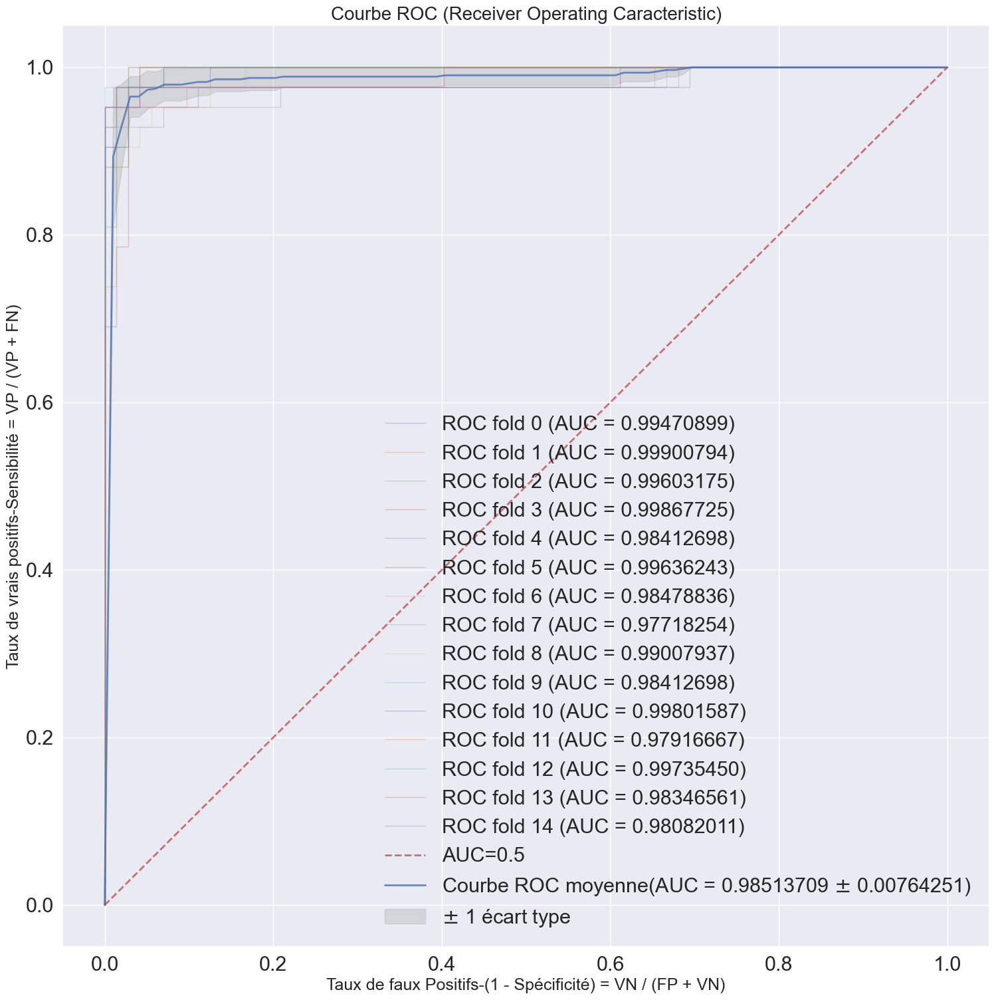

In [59]:
classificateurs = executeValidationCroisee(X = donnees_ft.loc[:,donnees_ft.filter(regex='Q100$', axis=1).columns].values, 
                                           y = donnees_ft.loc[:,cible].apply(lambda x: dictDiagnosis[x]).values, 
                                           classificateur=classificateursDict['LogisticRegression'],
                                           validation=StratifiedShuffleSplit(n_splits=15, test_size=0.2, random_state=0))

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Random_Forest - VariableQ100</div></b>

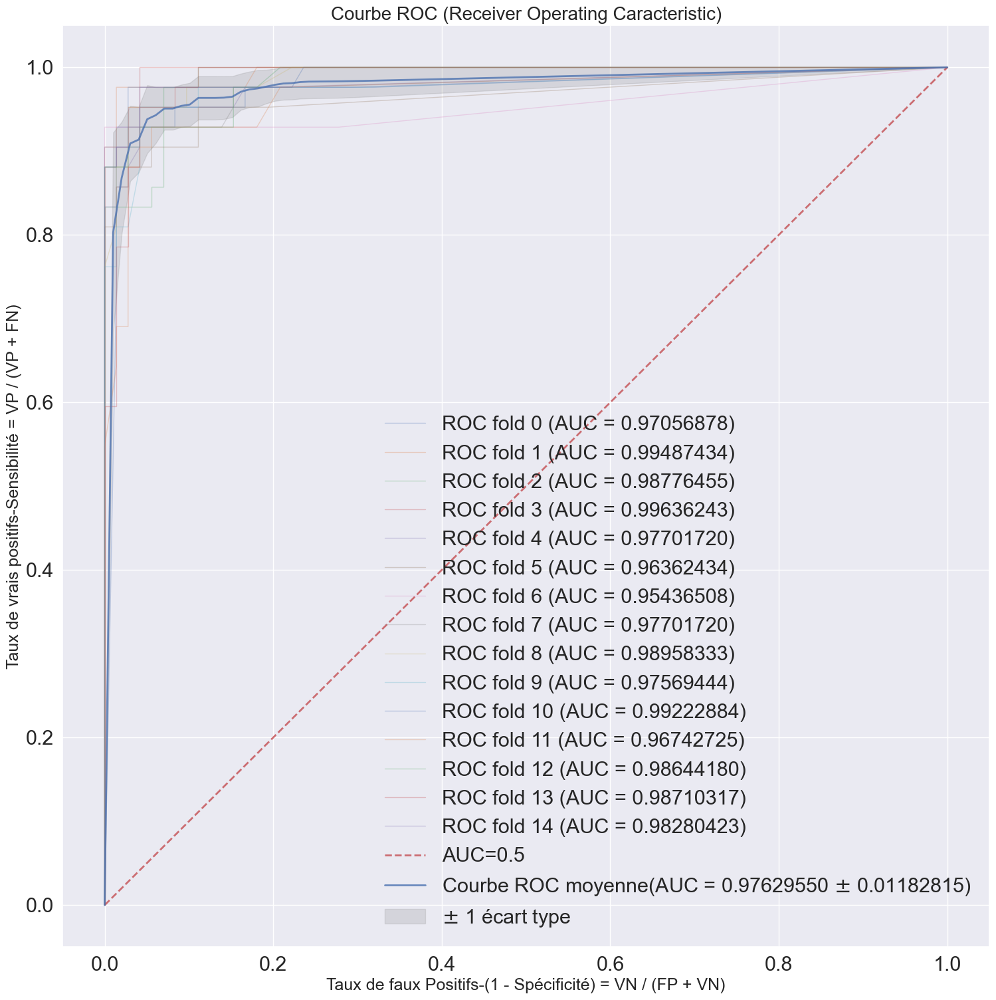

In [60]:
classificateurs = executeValidationCroisee(X = donnees_ft.loc[:,donnees_ft.filter(regex='Q100$', axis=1).columns].values, 
                         y = donnees_ft.loc[:,cible].apply(lambda x: dictDiagnosis[x]).values, 
                         classificateur=classificateursDict['Random_Forest'],
                         validation=StratifiedShuffleSplit(n_splits=15, test_size=0.2, random_state=0))

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Linear_SVM - StandardScaler</div></b>

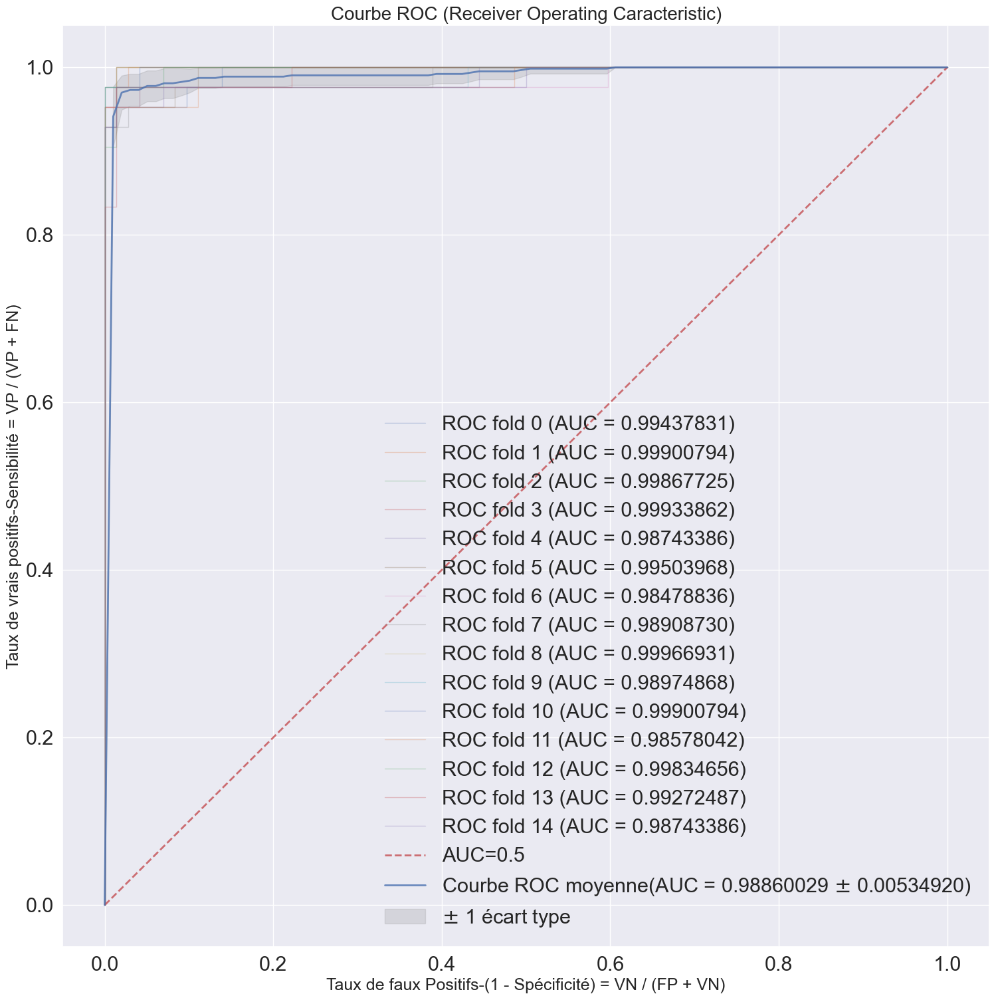

In [61]:
donnees = pd.read_parquet(os.path.join(projet.repertoireDonnees,'donnees_echantillons.parquet'))
X = donnees.loc[:,donnees.drop(columns=[cible,'échantillon']).columns]
y = donnees.loc[:,cible].apply(lambda x: dictDiagnosis[x])
X[X.columns] = modelStd.transform(X)
X = X[X.filter(regex='(se|worst)$', axis=1).columns]

classificateurs = executeValidationCroisee(X = X.values, 
                         y = y.values, 
                         classificateur=classificateursDict['Linear_SVM'],
                         validation=StratifiedShuffleSplit(n_splits=15, test_size=0.2, random_state=0))

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Multiples classificateurs du même type</div></b>

In [62]:
donnees = pd.read_parquet(os.path.join(projet.repertoireDonnees,'donnees_echantillons.parquet'))
X_train, X_test = \
                  donnees.loc[donnees['échantillon']=='apprentissage',donnees.drop(columns=[cible,'échantillon']).columns],\
                  donnees.loc[donnees['échantillon']=='test',donnees.drop(columns=[cible,'échantillon']).columns]

y_train, y_test = \
                  donnees.loc[donnees['échantillon']=='apprentissage',cible].apply(lambda x: dictDiagnosis[x]),\
                  donnees.loc[donnees['échantillon']=='test',cible].apply(lambda x: dictDiagnosis[x])

X_train[X_train.columns] = modelStd.transform(X_train)
X_test[X_test.columns] = modelStd.transform(X_test)

X_train = X_train[X_train.filter(regex='(se|worst)$', axis=1).columns]
X_test  = X_test[X_test.filter(regex='(se|worst)$', axis=1).columns]

In [63]:
n_splits=15
df = pd.DataFrame(data= y_test)
df.columns = ['y_test']
df['resultats'] = np.zeros(df.shape[0])

for i in range(n_splits):
    df['resultats'] += classificateurs[i].predict_proba(X_test)[:,1]

df['resultats'] /= n_splits
df['y_pred'] = df.resultats.round().astype('int8')

df.head()

,y_test,resultats,y_pred
id,,,
84358402,1,0.999998,1
844359,1,1.000000,1
844981,1,0.985283,1
846381,1,0.630695,1
851509,1,1.000000,1


In [64]:
pd.crosstab(df['y_pred'],df['y_test']).style.format("{:d}").background_gradient(cmap=plt.get_cmap('Blues'),axis=0)

y_test,0,1
y_pred,,
0,72,2
1,0,40


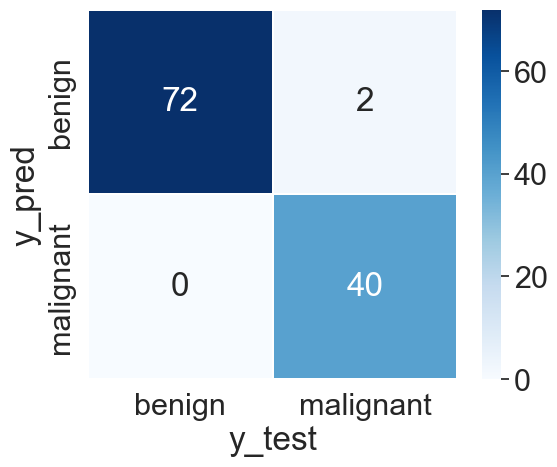

In [65]:
sns.heatmap(pd.crosstab(df['y_pred'],df['y_test']), 
            fmt= '.0f',
            linewidths=0.3,
            square=True, 
            cmap=plt.cm.Blues,
            linecolor='white', 
            annot=True,
            xticklabels=[dictLabels[nom] for nom in range(2)], 
            yticklabels=[dictLabels[nom] for nom in range(2)]
           );

In [66]:
def afficheMetrics(y_test,y_pred):
    accuracy                 = accuracy_score (y_test,y_pred)
    logloss                  = log_loss       (y_test,y_pred)
    hammingloss              = hamming_loss   (y_test,y_pred)
    precision                = precision_score(y_test,y_pred)
    sensibilite              = recall_score   (y_test,y_pred)
    f1                       = f1_score       (y_test,y_pred)
    jaccard_similarity       = jaccard_score  (y_test,y_pred)
    print(
          " Accuracy           : %.2f%%\n" % (accuracy * 100.0),       
          "logloss            : %.6f\n" % logloss           ,
          "hammingloss        : %.6f\n" % hammingloss       ,
          "precision          : %.6f\n" % precision         ,
          "sensibilite        : %.6f\n" % sensibilite       ,
          "f1                 : %.6f\n" % f1                ,
          "jaccard_similarity : %.6f\n" % jaccard_similarity
         )
    return accuracy,logloss,hammingloss,precision,sensibilite,f1,jaccard_similarity

In [67]:
metriques = afficheMetrics(df.y_test,df.y_pred)

 Accuracy           : 98.25%
 logloss            : 0.632345
 hammingloss        : 0.017544
 precision          : 1.000000
 sensibilite        : 0.952381
 f1                 : 0.975610
 jaccard_similarity : 0.952381

